# Ising Model Solution

In [5]:
import matplotlib.pyplot as plt
import numpy as np

## Simulation

In [62]:
def initialize_lattice(L):
    """randomly initialize a lattice of spins of size LxL

    Args:
        L (int): dimension of the lattice

    Returns:
        ndarray: initialized lattice of size LxL
    """
    lattice = np.random.choice([-1,1], size=(L,L))
    
    return lattice

def H(row, col, lattice, params):
    """calculates the nearest-neighbor interaction energies of a spin
    at location (row,col) in a lattice assuming periodic boundary conditions

    Args:
        row (_type_): _description_
        col (_type_): _description_
        lattice (_type_): _description_
    """
    L = lattice.shape[0]
    K = params["interaction_strength"]
    h = params["external_field"]
    # store central spin
    s = lattice[row][col]
    # store neighboring spins
    neighbors = np.zeros(4)
    neighbors[0] = lattice[(row - 1)%L][col]        # up
    neighbors[1] = lattice[(row + 1)%L][col]        # down
    neighbors[2] = lattice[row][(col - 1)%L]        # left
    neighbors[3] = lattice[row][(col + 1)%L]        # right
    # calculate the interaction energy and return
    energy = -K*np.sum(neighbors*s) + h*s
    return energy
    

def update(lattice, params):
    """updates the lattice by randomly selecting a spin
    and evolving it according to the Metropolis-Hastings algorithm

    Args:
        lattice (ndarray): current state of the system
        T (float): temperature of the system
    
    Returns:
        ndarray: new state of the system
    """
    L = lattice.shape[0]
    T = params["temperature"]
    row = np.random.randint(0,L)
    col = np.random.randint(0,L)
    
    E = H(row, col, lattice, params)
    boltzmann_weight = np.exp(-E/T)
    flip_boltzmann_weight = np.exp(E/T)
    
    accept_ratio = flip_boltzmann_weight/boltzmann_weight
    # if the energy is positive, then flipping is better
    if accept_ratio > 1:
        lattice[row][col] = -lattice[row][col]
    # otherwise, flip with probability given by the Boltzmann factor
    elif np.random.rand() < accept_ratio:
        lattice[row][col] = -lattice[row][col]
        
    return lattice

def sweep(lattice, params):
    L = lattice.shape[0]
    new_lattice = lattice.copy()
    for _ in range(L*L):
        new_lattice = update(new_lattice, params)
    return new_lattice

In [70]:
L = 128
params = {"temperature" : 2.2691, "interaction_strength" : 1, "external_field" : 0}
lattice = initialize_lattice(L)
snapshots = []
snapshots.append(lattice)
n_sweeps = 100
for i in range(n_sweeps):
    lattice = sweep(lattice, params)
    snapshots.append(lattice)
snapshots = np.asarray(snapshots)

## Animation

In [64]:
from matplotlib import animation, rcParams
from IPython.display import HTML
from imageio_ffmpeg import get_ffmpeg_exe
rcParams['animation.ffmpeg_path'] = get_ffmpeg_exe()

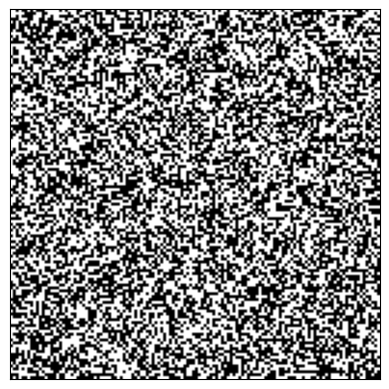

In [71]:
fig, ax = plt.subplots()
im = ax.imshow(snapshots[0], cmap="gray")
ax.set_xticks([])
ax.set_yticks([])

def update_frame(n):
    im.set_array(snapshots[n])
    return im,

In [72]:
anim = animation.FuncAnimation(fig, func=update_frame, frames=len(snapshots), interval=50, blit=True)
HTML(anim.to_jshtml())

In [91]:
np.sum(snapshots, axis=0)

array([[ 29,  -5, -49, ...,  75,  87,  73],
       [ 17,   7, -33, ...,  79,  61,  59],
       [ 33,  13, -25, ...,  55,  41,  45],
       ...,
       [ 15, -17, -61, ...,  91,  73,  49],
       [ 23, -13, -63, ...,  81,  81,  63],
       [ 17,  -7, -49, ...,  67,  65,  57]])

In [76]:
m

array([[ 29,  -5, -49, ...,  75,  87,  73],
       [ 17,   7, -33, ...,  79,  61,  59],
       [ 33,  13, -25, ...,  55,  41,  45],
       ...,
       [ 15, -17, -61, ...,  91,  73,  49],
       [ 23, -13, -63, ...,  81,  81,  63],
       [ 17,  -7, -49, ...,  67,  65,  57]])

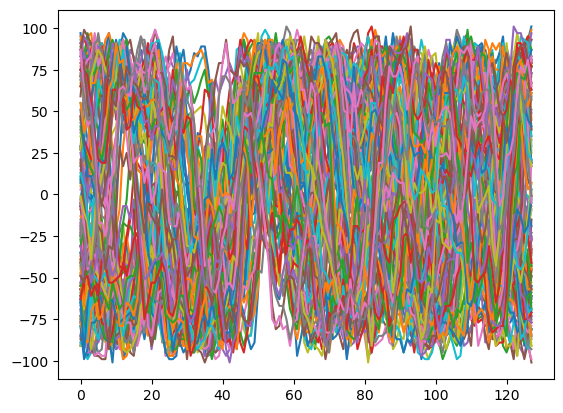

In [75]:
plt.plot(m)